# Импорт библиотек и загрузка данных

In [10]:
import os
import pickle

import json
from urllib.request import urlopen

import requests

# для расчета расстояния между координатами
#import haversine as hs

import numpy as np
import pandas as pd
#import geopandas as gpd
#from shapely import wkt

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

import matplotlib.pyplot as plt
import seaborn as sns
#import plotly.graph_objects as go

from sklearn.metrics import recall_score, f1_score, roc_auc_score
import pickle

#import plotly.express as px

#%config InlineBackend.figure_format = 'retina'
#%matplotlib inline

import warnings
warnings.filterwarnings(action='ignore')

In [2]:
# ???
#import pyarrow
#import fastparquet

In [3]:
#!pip install geopandas

In [4]:
#import geopandas as gpd

In [5]:
# from google.colab import drive
# drive.mount('/content/drive')

In [6]:
# import os
# os.chdir("/content/drive/MyDrive/data")
# !ls

# Работа с термоточками по всей России для обучения

In [7]:
# Временные интервалы, с которыми мы работаем
# DATE_START = '2018-01-01'
# DATE_END = '2020-04-02'

DATE_START = '2009-01-01'
DATE_END = '2020-11-03'

## Загрузка всех термоточек, кроме Самарской области

In [8]:
thermo_all = pd.read_csv('data/термоточки.csv', sep=';', ) # чтение из файла
thermo_all['geo'] = thermo_all['geo'].apply(wkt.loads) # приведение к гео-формату
thermo_all = gpd.GeoDataFrame(thermo_all, geometry='geo') # создание гео-датафрейма
thermo_all = thermo_all.dropna() # выбросим данные с пропушенной датой
thermo_all = thermo_all.sort_values('eventDate', ascending=False)[1:230001] # возбмем данные начиная с 2018 года

thermo_all['area'] = thermo_all['area'].apply(
    lambda x: float(x.replace(',', '.')) if type(x)==str else x) # приведение к фисловому формату

thermo_all['lon'] = thermo_all['geo'].apply(
    lambda x: x.x if x.type=='Point' else x.centroid.x) # выделение координаты термоточки
thermo_all['lat'] = thermo_all['geo'].apply(
    lambda x: x.y if x.type=='Point' else x.centroid.y)# выделение координаты термоточки

thermo_all.index = pd.to_datetime(thermo_all['eventDate']) # временной индекс
thermo_all = thermo_all.drop(['geo', 'OBJ_ID', 'OBJ_NAME', 'LAST_MODIFIED_DATE', 'eventDate'], axis=1)

In [9]:
thermo_all.shape

(230000, 3)

In [10]:
thermo_all.sort_index()

,area,lon,lat
eventDate,,,
2018-02-01,203.1027,138.157399,46.440044
2018-02-01,252.9471,108.287409,59.663613
2018-02-01,112.1611,130.365329,42.790714
2018-02-01,127.1093,86.077243,55.545704
2018-02-01,204.9394,83.653596,52.184908
...,...,...,...
2020-04-02,191.0462,119.158066,52.304602
2020-04-02,1329.3358,118.069443,51.519674
2020-04-02,275.9370,131.369877,42.778671


## Загрузка термоточек Самарской области

In [11]:
thermo_sam_obl = pd.read_csv('data/термоточки Самарская обл с 2000г.csv', sep=';',
                             parse_dates=True, index_col=2, dayfirst=True,
                             usecols=['latitude', 'longitude', 'acq_date'])[['longitude', 'latitude']]
thermo_sam_obl['area'] = 1
thermo_sam_obl = thermo_sam_obl.rename(columns={'longitude': 'lon', 'latitude': 'lat'})
thermo_sam_obl = thermo_sam_obl.sort_index()[DATE_START:]

In [12]:
thermo_sam_obl.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 16857 entries, 2009-03-30 to 2020-11-03
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   lon     16857 non-null  float64
 1   lat     16857 non-null  float64
 2   area    16857 non-null  int64  
dtypes: float64(2), int64(1)
memory usage: 526.8 KB


In [13]:
thermo_sam_obl

,lon,lat,area
acq_date,,,
2009-03-30,51.3223,52.1891,1
2009-03-30,51.3172,52.1881,1
2009-03-30,51.3370,52.1922,1
2009-03-31,50.1100,52.9983,1
2009-03-31,51.6992,53.4305,1
...,...,...,...
2020-10-20,49.5975,53.0239,1
2020-10-20,49.6151,53.0272,1
2020-10-20,49.8979,52.3161,1


### Все термоточки по Самарской области

<AxesSubplot:xlabel='month', ylabel='area'>

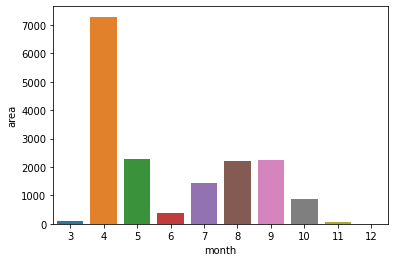

In [14]:
thermo_sam_obl_copy = thermo_sam_obl.copy()
thermo_sam_obl_copy['month'] = thermo_sam_obl_copy.index.month.values
group_thermo_sam_obl_copy = thermo_sam_obl_copy.groupby('month').count()
sns.barplot(x=group_thermo_sam_obl_copy.index, y=group_thermo_sam_obl_copy.area)

### Разделим термоточки Самара на train и test части

In [15]:
thermo_sam_obl_train, thermo_sam_obl_test = train_test_split(thermo_sam_obl, test_size=0.2, random_state=42)
display(thermo_sam_obl_train)
display(thermo_sam_obl_test)

,lon,lat,area
acq_date,,,
2010-04-25,51.4044,54.1827,1
2010-08-01,49.7697,52.8826,1
2019-04-22,51.0699,54.0879,1
2009-04-26,48.6014,53.7204,1
2010-04-15,48.8766,53.2083,1
...,...,...,...
2015-04-12,51.3337,53.3205,1
2015-09-07,51.3806,52.2684,1
2010-07-25,50.3326,53.4945,1


,lon,lat,area
acq_date,,,
2009-04-16,49.9925,53.4973,1
2009-07-28,49.9426,52.6976,1
2018-09-05,50.1540,52.8187,1
2011-10-21,49.1422,53.6759,1
2020-05-01,48.4441,52.9953,1
...,...,...,...
2009-04-28,48.8117,53.1990,1
2012-07-16,51.1889,52.8779,1
2015-09-21,49.2861,53.8174,1


### Train термоточки по Самарской области

<AxesSubplot:xlabel='month', ylabel='area'>

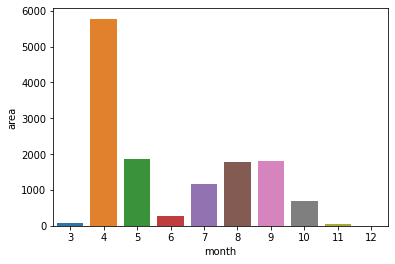

In [16]:
thermo_sam_obl_copy = thermo_sam_obl_train.copy()
thermo_sam_obl_copy['month'] = thermo_sam_obl_copy.index.month.values
group_thermo_sam_obl_copy = thermo_sam_obl_copy.groupby('month').count()
sns.barplot(x=group_thermo_sam_obl_copy.index, y=group_thermo_sam_obl_copy.area)

### Test термоточки по Самарской области

<AxesSubplot:xlabel='month', ylabel='area'>

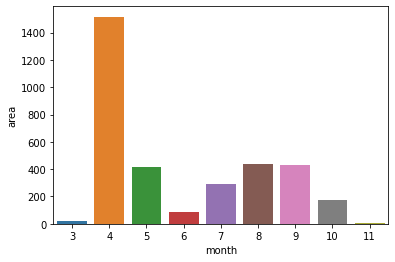

In [17]:
thermo_sam_obl_copy = thermo_sam_obl_test.copy()
thermo_sam_obl_copy['month'] = thermo_sam_obl_copy.index.month.values
group_thermo_sam_obl_copy = thermo_sam_obl_copy.groupby('month').count()
sns.barplot(x=group_thermo_sam_obl_copy.index, y=group_thermo_sam_obl_copy.area)

In [18]:
thermo_sam_obl_test.to_csv('data/thermo_sam_obl_test.csv')

In [19]:
thermo_all[thermo_all.duplicated()]

,area,lon,lat
eventDate,,,
2020-04-01,202.5053,115.802733,53.112517
2020-04-01,110.8695,113.357958,54.325583
2020-04-01,419.0477,108.892117,51.336990
2020-04-01,402.3543,103.308722,52.998482
2020-04-01,102.5758,115.982444,52.113001
...,...,...,...
2018-02-22,155.6511,106.789768,56.574861
2018-02-22,104.8477,111.547376,60.289356
2018-02-22,1786.9232,131.075930,42.744085


In [20]:
len(thermo_all)

230000

In [21]:
thermo_all = pd.concat([thermo_all, thermo_sam_obl_train])

In [22]:
thermo_all[thermo_all.duplicated()]

,area,lon,lat
2020-04-01,202.5053,115.802733,53.112517
2020-04-01,110.8695,113.357958,54.325583
2020-04-01,419.0477,108.892117,51.336990
2020-04-01,402.3543,103.308722,52.998482
2020-04-01,102.5758,115.982444,52.113001
...,...,...,...
2018-02-22,527.1667,126.713615,36.987710
2013-08-12,1.0000,51.217300,52.863300
2011-10-07,1.0000,51.202800,52.873400
2012-08-07,1.0000,51.200400,52.874200


In [23]:
thermo_all.shape

(243485, 3)

## Загрузка погодных станций для обучения вместе с Самарской областью

In [24]:
train_station_names = ['Astrahan', 
                       'Sosnovo-Ozersk', 
                       'Romanovka', 
                       'Nerchinkiy zavod',
                       'Ekaterino-Nikolskoe', 
                       'Smolensk', 
                       'Chernyahovsk',
                       'Slavyansk-na-Kubani',
                       'Cherkessk',
                       'Haihe',
                       'Nazarovo',
                       'Astrahanka',
                       'Mutorai',
                       'Semikarakorsk',
                       'Verhoyansk',
                       'Rylsk',
                       'Samara', 
                       'Avangard', 
                       'Syzran', 
                       #'Серноводск', 
                       'Chelnoversh', 
                       'Glushica',
                       #'Клявлино', 
                       #'Тольятти', 
                       'Buguruslan',
                      ]

train_station_locs = [[48.04, 46.17], 
                     [111.33, 52.32], 
                     [112.47, 53.12], 
                     [119.37, 51.18], 
                     [131.58, 47.74], 
                     [32.4, 54.45], 
                     [21.8, 54.63],
                     [38.08, 45.15],
                     [42.03, 44.14],
                     [127.27, 50.15],
                     [90.24, 56.00],
                     [132.04, 44.43],
                     [100.30, 61.20],
                     [40.48, 47.31],
                     [133.23, 67.33],
                     [34.41, 51.34],
                     [50.13, 53.11], 
                     [51.17, 52.37], 
                     [48.28, 53.10], 
                     #[51.16, 53.55], 
                     [51.06, 54.25], 
                     [50.28, 52.23],
                     #[52.00, 54.18], 
                     #[49.24, 53.32], 
                     [52.26, 53.40]
                     ]
train_stations = pd.DataFrame(train_station_locs, index = train_station_names, columns=['lon', 'lat']).sort_index()
train_stations

,lon,lat
Astrahan,48.04,46.17
Astrahanka,132.04,44.43
Avangard,51.17,52.37
Buguruslan,52.26,53.40
Chelnoversh,51.06,54.25
Cherkessk,42.03,44.14
Chernyahovsk,21.80,54.63
Ekaterino-Nikolskoe,131.58,47.74
Glushica,50.28,52.23
Haihe,127.27,50.15


## Нанесение всех станций и термоточек для обучения на карту

In [25]:
with urlopen('https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/russia.geojson') as response:
    counties = json.load(response) # для подгрузки карты
    
fig_all = go.Figure()
fig_all.add_trace(go.Choroplethmapbox(geojson=counties,)) # plot Russian map

# plot thermopoints
fig_all.add_trace(go.Scattermapbox(
    lon = thermo_all['lon'][:50000], # ограничим кол-во термоточек - 50k
    lat = thermo_all['lat'][:50000],
    mode = 'markers',
    marker = dict(
        #size = 6,#thermo['area']/SCALE,
        color = 'red',
        sizemode = 'area',
        opacity=0.6), 
    name = 'thermo'
))

# Добавим станции и рассматриваемые области вокруг них на карту
for idx, station in train_stations.iterrows():
    fig_all.add_trace(go.Scattermapbox(
        lon = [station.lon], lat = [station.lat], marker = dict(size=12, color='blue'), name = idx))
    fig_all.add_trace(go.Scattermapbox(
        lon = [station.lon], lat = [station.lat], 
        marker = dict(size=100, color='blue', opacity=0.1), name = idx+'_area'))

fig_all.update_layout(
    height=600,
    width=1000,
    mapbox_style="open-street-map",
    mapbox_zoom=4, 
    mapbox_center = {"lat": 53, "lon": 50},
    margin={"r":0,"t":5,"l":0,"b":0})

fig_all.show()

## Соотнесение тренировочных термоточек и погодных станций

In [26]:
# радиус 100км
RADIUS = 100

In [27]:
#hs.haversine((48.04, 46.17), (132.04, 44.43))

In [28]:
#hs.haversine((46.17, 48.04), (44.43, 132.04))

In [29]:
%%time
def calc_distance(a1, b1, a2, b2):
    "Расстояние между точками (не учитываем искривленность поверхности)"
    return np.sqrt((a1-a2)**2 + (b1-b2)**2)

station_index = []
for _, th in thermo_all.iterrows(): # для каждой термоточки
    dist = []
    
    for _,st in train_stations.iterrows(): # для каждой станции
        #dist.append(calc_distance(th['lon'], th['lat'], st['lon'], st['lat'])) # расстояние от станции до термоточки
        
        # расстояние от станции до термоточки по формуле Хаверсина (haversine) в километрах
        # передаваемые координаты: (широта, долгота) = (lat, lon)
        dist.append(hs.haversine((th['lat'], th['lon']), (st['lat'], st['lon'])))
        
        #dist.append(calc_distance(th['lon'], th['lat'], st['lon'], st['lat'])) # расстояние от станции до термоточки
        
    #st_idx = np.where(np.array(dist)<2)[0]  # индексы станции, назодящиеся вблизи термоточки
    st_idx = np.where(np.array(dist) < RADIUS)[0]  # индексы станции, назодящиеся вблизи термоточки
    
    if st_idx.size > 0: # если индексы существует, то записываем номер станции
        station_index.append(st_idx[0].astype(int))
    else: # иначе записываем несуществующий номер станции (100 в данном слуачае)
        station_index.append(100)

station_index = np.array(station_index)

train_thermo = [] # список с датафреймами из термоточек по каждой погодной станции
for i in range(len(train_stations)):
    train_thermo.append(thermo_all.iloc[np.where(station_index==i)[0]])

CPU times: user 3min 19s, sys: 37 ms, total: 3min 19s
Wall time: 3min 19s


In [30]:
np.unique(station_index, return_counts=True) # кол-во термоточек на каждой станции

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21, 100]),
 array([  1968,   5730,   4263,   2783,   2397,   1073,   1088,   3279,
          1384,   2065,   4789,   1769,   2807,   1641,    473,   2703,
          1031,   1538,   1754,   1159,    817,   3238, 193736]))

In [31]:
len(train_thermo) == len(train_stations)

True

## Загрузка и препроцессинг погоды с выбранных станций

In [32]:
train_weather = [] # список с погодными датафреймами
FOLDER = 'pogoda_train/'
for sheet in sorted(os.listdir(FOLDER)): # все файлы в папке
    if not sheet.startswith('.'): # исключить системный мак файл
        weather = pd.read_excel(FOLDER+sheet, skiprows=6, index_col=0)
        train_weather.append(weather)

In [33]:
# Размерности датасетов    
[(i.index.name, i.shape) for i in train_weather]

[('Местное время в Астрахани', (6351, 28)),
 ('Местное время в Астраханке', (6335, 28)),
 ('Местное время в Авангарде Зерносовхозе', (34577, 28)),
 ('Местное время в Бугуруслане', (37399, 28)),
 ('Местное время в Челно-Вершинах', (37401, 28)),
 ('Местное время в Черкесске', (6331, 28)),
 ('Местное время в Черняховске', (6282, 28)),
 ('Местное время в Екатерино-Никольском', (6335, 28)),
 ('Местное время в Большой Глушице', (37402, 28)),
 ('Местное время в Хэйхэ', (6329, 28)),
 ('Местное время в Муторае', (6310, 28)),
 ('Местное время в Назарово', (6335, 28)),
 ('Местное время в Нерчинском Заводе', (6333, 28)),
 ('Местное время в Романовке', (6335, 28)),
 ('Местное время в Рыльске', (6182, 28)),
 ('Местное время в Самаре', (37003, 28)),
 ('Местное время в Семикаракорске', (6327, 28)),
 ('Местное время в Славянске-на-Кубани', (6333, 28)),
 ('Местное время в Смоленске', (6335, 28)),
 ('Местное время в Сосново-Озерском', (6335, 28)),
 ('Местное время в Сызрани', (37403, 28)),
 ('Местное вре

In [34]:
def prepare_weather_dataset(df, thresh=0.3, date_start=DATE_START, date_end=DATE_END):
    """Заполнение пропусков и очистка данных в погодном датасете"""
    
    # (Ю) в фалах погоды время указано в формате d.m.y
    # поэтому индекс приводим к типу дата с указанием dayfirst=True
    
    df.index = pd.to_datetime(df.index, dayfirst=True) # приводим к формату времени
    df = df.sort_index() # соритруем по дате
    
    df['N'] = df['N'].fillna(method='ffill').fillna(method='bfill') # данные по облачности_1
    
    # (Ю) убрали этот признак
    #df['Nh'] = df['Nh'].fillna(method='ffill').fillna(method='bfill') # данные по облачности_2
    # (Ю) убрали этот признак
    #df['VV'] = df['VV'].fillna(method='ffill').fillna(method='bfill') # данные по видимости (туман)
    #df['VV'] = df['VV'].replace('менее 0.05', 0.02).replace('менее 0.1', 0.02)
    # (Ю) убрали этот признак
    #df['H'] = df['H'].fillna(method='ffill').fillna(method='bfill') # данные по высоте облаков
    
    df['RRR'] = df['RRR'].replace('Осадков нет', 0).replace('Следы осадков', 0.1).fillna(0) # кол-во осадков, нет записи --> нет осадков
    
    #df['sss'] = df['sss'].fillna(0) # кол-во снега, нет записи --> нет снега
    #df['sss'] = df['sss'].replace('Менее 0.5', 0.5).replace('Снежный покров не постоянный.', 0.5).replace('Измерение невозможно или неточно.', 0)
    
    df = df.drop(['Ch', 'Cl', 'Cm', 'W1', 'W2', 'WW',
                  'Po', 'Pa', 'ff10', 'ff3', 'sss',
                  'Nh', 'VV', 'H'], axis=1)
    print('Процент пропущенных значений {}:\n{}'.format(df.index.name.split('время')[1],
                                                    (df.isna().sum()/df.shape[0]).sort_values(ascending=False)))
    cond = df.isna().sum()/df.shape[0]<thresh  # определяем долю пропущенных значений, чтобы не удалять признак
    idx_to_use = np.where(cond)[0] # какие колонки оставить, в зависимости от кол-ва пропущенных значений
    df = df.iloc[:, idx_to_use].fillna(method='ffill') # заполняем значениями предыдущего дня
    df = df[date_start:date_end] # выберем определенный промежуток времени
    return df

In [35]:
train_weather_prepared = list(map(prepare_weather_dataset, train_weather)) # погодные датасеты подготовленны

Процент пропущенных значений  в Астрахани:
E'     0.992442
E      0.931507
Tg     0.931507
Tx     0.874980
Tn     0.845536
tR     0.750276
T      0.000000
P      0.000000
U      0.000000
DD     0.000000
Ff     0.000000
N      0.000000
Td     0.000000
RRR    0.000000
dtype: float64
Процент пропущенных значений  в Астраханке:
E'     0.970324
E      0.937017
Tg     0.937017
Tx     0.875138
Tn     0.834412
tR     0.750276
T      0.000000
P      0.000000
U      0.000000
DD     0.000000
Ff     0.000000
N      0.000000
Td     0.000000
RRR    0.000000
dtype: float64
Процент пропущенных значений  в Авангарде Зерносовхозе:
E'     0.953698
Tg     0.952888
E      0.920583
Tn     0.898516
Tx     0.874917
tR     0.807357
DD     0.002603
Ff     0.002603
U      0.001677
T      0.000868
Td     0.000839
P      0.000405
N      0.000000
RRR    0.000000
dtype: float64
Процент пропущенных значений  в Бугуруслане:
Tg     0.967780
E      0.960962
E'     0.958502
Tx     0.874943
Tn     0.859328
tR     0.801679

In [36]:
# Размерности датасетов после преобразования   
[i.shape for i in train_weather_prepared]

[(6351, 8),
 (6335, 8),
 (34518, 8),
 (34520, 8),
 (34522, 8),
 (6331, 8),
 (6282, 8),
 (6335, 8),
 (34524, 8),
 (6329, 8),
 (6310, 8),
 (6335, 8),
 (6333, 8),
 (6335, 8),
 (6182, 8),
 (34196, 8),
 (6327, 8),
 (6333, 8),
 (6335, 8),
 (6335, 8),
 (34524, 8),
 (6334, 8)]

## Склейка датасетов погоды и термоточек для каждой погодной станции

In [37]:
ds_train = []
for n in range(len(train_weather_prepared)):
    ds = pd.merge(train_thermo[n], train_weather_prepared[n], left_index=True, right_index=True, how='outer') # термо + погода
    ds[ds.columns[:3]] = ds[ds.columns[:3]].fillna(0) # заполняем пропуски, связанные с термоточками
    ds[ds.columns[3:]] = ds[ds.columns[3:]].fillna(method='ffill') # заполняем пропуски, связанные с погодой
    # если всё-таки остались пропуски
    #ds = ds.dropna()
    ds_train.append(ds) # добавялем к общему списку

In [38]:
ds_train[2].head(15)

,area,lon,lat,T,P,U,DD,Ff,N,Td,RRR
2009-01-01 01:00:00,0.0,0.0,0.0,-11.7,770.0,90.0,"Ветер, дующий с западо-юго-запада",3.0,Облаков нет.,-13.0,0.0
2009-01-01 04:00:00,0.0,0.0,0.0,-12.0,769.2,85.0,"Ветер, дующий с юго-запада",4.0,100%.,-14.0,0.0
2009-01-01 07:00:00,0.0,0.0,0.0,-15.8,768.2,90.0,"Ветер, дующий с юго-запада",3.0,100%.,-17.1,0.0
2009-01-01 10:00:00,0.0,0.0,0.0,-13.1,767.2,90.0,"Ветер, дующий с юга",5.0,100%.,-14.4,0.0
2009-01-01 16:00:00,0.0,0.0,0.0,-11.8,763.4,85.0,"Ветер, дующий с юго-юго-запада",5.0,70 – 80%.,-13.8,0.0
2009-01-01 19:00:00,0.0,0.0,0.0,-14.8,762.6,85.0,"Ветер, дующий с юго-юго-запада",4.0,Облаков нет.,-16.8,0.0
2009-01-01 22:00:00,0.0,0.0,0.0,-14.7,760.6,80.0,"Ветер, дующий с юго-юго-запада",5.0,20–30%.,-17.4,0.2
2009-01-02 01:00:00,0.0,0.0,0.0,-12.7,759.0,85.0,"Ветер, дующий с юго-запада",5.0,100%.,-14.7,0.0
2009-01-02 04:00:00,0.0,0.0,0.0,-11.5,758.3,85.0,"Ветер, дующий с юго-запада",5.0,100%.,-13.5,0.0
2009-01-02 07:00:00,0.0,0.0,0.0,-10.9,756.2,85.0,"Ветер, дующий с юго-запада",4.0,100%.,-12.9,0.2


In [39]:
def prepare_dataset(ds):
    """Resample and generate new features in combined dataset"""
    a = pd.get_dummies(ds).copy()
    a = a.resample('1d').mean().fillna(method='ffill')
    
    #a['T_min'] = ds['T'].resample('1d').min() # минимальная темература за день
    #a['T_max'] = ds['T'].resample('1d').max() # максимальная темература за день
    #a['Td_min'] = ds['Td'].resample('1d').min() # минимальная темература точки росы за день
    #a['Td_max'] = ds['Td'].resample('1d').max() # максимальная темература точки росы за день
    
    a['RRR'] = ds['RRR'].resample('1d').sum() # суммарное кол-во осадков за день
    a['day'] = a.index.day # день записи
    a['month'] = a.index.month  # месяц записи
    #a['T_max_over_25'] = (a['T_max']>25).astype(int)
    
    a = a.drop(['lon', 'lat'], axis=1) # удалим местоположение точки, в случае ее наличия
    
    a.loc[a['area']>0, 'area'] = 1 # бинарное кодирование наличия термоточки (при тренировке и валидации)
    a['thermo_area'] = ds['area'].resample('1d').sum()

#     # накапливаемая температура (считается куммулитвная сумма темпертур, если были осадки - все обнуляется)
#     T_cum = [a.iloc[0]['T']]
#     for i in range(1, len(a)):
#         if (a.iloc[i]['RRR']==0) and (a.iloc[i]['T']>0):
#             current_sum = T_cum[i-1] + a.iloc[i]['T']
#             T_cum.append(current_sum)
#         else:
#             T_cum.append(0)
#     a['T_cumsum'] = np.array(T_cum)
    
#     # кол-во последовательных дней с температурой выше 25 градусов (если меньше 20, то счетчик обнуляется)
#     T_max_over_25 = [a.iloc[0]['T_max_over_25']]
#     current_sum = 0
#     for i in range(1, len(a)):
#         if (a.iloc[i]['T_max']>=25):
#             current_sum += 1
#         elif a.iloc[i]['T_max']<20:
#             current_sum = 0
#         T_max_over_25.append(current_sum)
#     a['T_cumsum_over_25'] = np.array(T_max_over_25)
    
    return a

In [40]:
for n in range(len(ds_train)):
    ds_train[n] = prepare_dataset(ds_train[n]) # подготовим датасеты

In [41]:
len(ds_train)

22

In [42]:
ds_train[4]

,area,T,P,U,Ff,Td,RRR,"DD_Ветер, дующий с востока","DD_Ветер, дующий с востоко-северо-востока","DD_Ветер, дующий с востоко-юго-востока",...,N_40%.,N_50%.,N_60%.,N_70 – 80%.,"N_90 или более, но не 100%",N_Небо не видно из-за тумана и/или других метеорологических явлений.,N_Облаков нет.,day,month,thermo_area
2009-01-01,0.0,-9.714286,762.285714,89.571429,4.142857,-11.1000,0.6,0.000,0.000,0.0,...,0.0,0.000,0.000,0.000,0.000,0.00,0.000,1,1,0.0
2009-01-02,0.0,-9.800000,753.525000,83.750000,3.000000,-12.0125,1.1,0.000,0.000,0.0,...,0.0,0.000,0.000,0.000,0.000,0.00,0.000,2,1,0.0
2009-01-03,0.0,-15.250000,756.862500,83.125000,1.875000,-17.4625,0.9,0.000,0.000,0.0,...,0.0,0.000,0.000,0.000,0.000,0.00,0.125,3,1,0.0
2009-01-04,0.0,-18.362500,761.612500,80.625000,3.250000,-20.8750,0.0,0.000,0.000,0.0,...,0.0,0.000,0.000,0.125,0.000,0.00,0.125,4,1,0.0
2009-01-05,0.0,-15.600000,762.425000,83.750000,2.125000,-17.7250,1.6,0.000,0.000,0.0,...,0.0,0.000,0.125,0.000,0.125,0.00,0.000,5,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-10-30,0.0,2.500000,771.037500,71.750000,3.625000,-2.2250,0.0,0.000,0.000,0.0,...,0.0,0.125,0.000,0.500,0.125,0.00,0.000,30,10,0.0
2020-10-31,0.0,4.150000,766.637500,70.750000,2.875000,-0.8000,0.3,0.000,0.000,0.0,...,0.0,0.000,0.000,0.000,0.000,0.00,0.000,31,10,0.0
2020-11-01,0.0,3.637500,769.412500,88.250000,2.875000,1.8375,0.0,0.000,0.375,0.0,...,0.0,0.000,0.000,0.000,0.000,0.00,0.000,1,11,0.0
2020-11-02,0.0,2.212500,771.850000,94.875000,2.500000,1.4250,0.2,0.125,0.625,0.0,...,0.0,0.000,0.000,0.000,0.000,0.00,0.000,2,11,0.0


In [43]:
#ds_train[4].to_csv('fires_df.csv')

In [44]:
#ds_train[4][3460:].to_csv('fires_df_test.csv')

In [45]:
# for ind, data in enumerate(ds_train):
#     display(ind)
#     #display(data)
#     display(data.query("area == 1"))

In [46]:
# plt.figure(figsize=(20,16))
# sns.heatmap(ds_train[0].corr(), linecolor='black', linewidths=0.1)

In [47]:
[ds['area'].value_counts(normalize=True) for ds in ds_train] # распределения несбалансированные, но несильно

[0.0    0.702771
 1.0    0.297229
 Name: area, dtype: float64,
 0.0    0.704545
 1.0    0.295455
 Name: area, dtype: float64,
 0.0    0.805549
 1.0    0.194451
 Name: area, dtype: float64,
 0.0    0.873526
 1.0    0.126474
 Name: area, dtype: float64,
 0.0    0.885318
 1.0    0.114682
 Name: area, dtype: float64,
 0.0    0.755051
 1.0    0.244949
 Name: area, dtype: float64,
 0.0    0.899244
 1.0    0.100756
 Name: area, dtype: float64,
 0.0    0.791667
 1.0    0.208333
 Name: area, dtype: float64,
 0.0    0.899422
 1.0    0.100578
 Name: area, dtype: float64,
 0.0    0.801768
 1.0    0.198232
 Name: area, dtype: float64,
 0.0    0.875
 1.0    0.125
 Name: area, dtype: float64,
 0.0    0.780303
 1.0    0.219697
 Name: area, dtype: float64,
 0.0    0.794192
 1.0    0.205808
 Name: area, dtype: float64,
 0.0    0.770202
 1.0    0.229798
 Name: area, dtype: float64,
 0.0    0.852273
 1.0    0.147727
 Name: area, dtype: float64,
 0.0    0.851329
 1.0    0.148671
 Name: area, dtype: float64

По большому счету, нас не интересует конкретная дата, а только последовательность событий, поэтому данный датасет - условно временной. Соберем все датасеты (погода+термоточки) от каждой станции в один датасет и будем обучаться на нем. Для валидации - не перемешиваем данные и кол-во фолдов должно равняться кол-ву погодных станций.

In [48]:
ds_train_full = pd.concat([ds_train[i] for i in range(len(ds_train))]) # собираем все датасеты в один
ds_train_full = ds_train_full.fillna(0) # заполним пропуски в dummy переменных
print('Размерность собранного датасета (погода + термоточки): {}'.format(ds_train_full.shape))

Размерность собранного датасета (погода + термоточки): (38626, 37)


In [49]:
ds_train_full

,area,T,P,U,Ff,Td,RRR,"DD_Ветер, дующий с востока","DD_Ветер, дующий с востоко-северо-востока","DD_Ветер, дующий с востоко-юго-востока",...,N_40%.,N_60%.,N_70 – 80%.,"N_90 или более, но не 100%",N_Небо не видно из-за тумана и/или других метеорологических явлений.,N_Облаков нет.,day,month,thermo_area,N_50%.
2018-02-01,0.0,-0.5875,763.3250,84.875,4.375,-2.9125,1.1,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.0,0.000,1,2,0.0,0.000
2018-02-02,0.0,-3.0000,770.5125,74.125,1.125,-7.1500,0.0,0.125,0.000,0.000,...,0.000,0.125,0.125,0.125,0.0,0.000,2,2,0.0,0.000
2018-02-03,0.0,-2.9500,769.7750,89.625,2.625,-4.5125,0.0,0.875,0.000,0.125,...,0.000,0.000,0.000,0.250,0.0,0.000,3,2,0.0,0.000
2018-02-04,0.0,1.8500,766.7750,85.375,3.500,-0.4500,0.0,0.750,0.000,0.250,...,0.000,0.000,0.000,0.125,0.0,0.000,4,2,0.0,0.000
2018-02-05,0.0,1.4875,762.7875,83.500,3.000,-1.1125,2.0,0.750,0.000,0.125,...,0.000,0.000,0.000,0.000,0.0,0.000,5,2,0.0,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-03-29,0.0,-18.8500,746.2125,68.875,1.000,-23.3000,0.2,0.000,0.000,0.000,...,0.000,0.000,0.250,0.000,0.0,0.000,29,3,0.0,0.125
2020-03-30,0.0,-18.2750,748.0875,69.000,1.250,-22.9000,0.1,0.125,0.000,0.000,...,0.000,0.000,0.250,0.000,0.0,0.000,30,3,0.0,0.125
2020-03-31,0.0,-19.1000,748.2250,64.750,0.500,-24.4375,0.1,0.000,0.125,0.000,...,0.000,0.000,0.000,0.000,0.0,0.250,31,3,0.0,0.125
2020-04-01,0.0,-21.4375,749.7500,58.375,0.375,-27.8250,0.0,0.000,0.000,0.000,...,0.250,0.125,0.125,0.000,0.0,0.250,1,4,0.0,0.125


In [50]:
#ds_train_full.loc['2018-02-09']

In [51]:
#ds_train_full.to_csv('fire_train_full.csv')

In [52]:
ds_train_full.to_parquet('df_train.gzip', compression='gzip')

In [53]:
ds_train_full.columns

Index(['area', 'T', 'P', 'U', 'Ff', 'Td', 'RRR', 'DD_Ветер, дующий с востока',
       'DD_Ветер, дующий с востоко-северо-востока',
       'DD_Ветер, дующий с востоко-юго-востока', 'DD_Ветер, дующий с запада',
       'DD_Ветер, дующий с западо-северо-запада',
       'DD_Ветер, дующий с западо-юго-запада', 'DD_Ветер, дующий с севера',
       'DD_Ветер, дующий с северо-востока', 'DD_Ветер, дующий с северо-запада',
       'DD_Ветер, дующий с северо-северо-востока',
       'DD_Ветер, дующий с северо-северо-запада', 'DD_Ветер, дующий с юга',
       'DD_Ветер, дующий с юго-востока', 'DD_Ветер, дующий с юго-запада',
       'DD_Ветер, дующий с юго-юго-востока',
       'DD_Ветер, дующий с юго-юго-запада', 'DD_Штиль, безветрие',
       'N_10%  или менее, но не 0', 'N_100%.', 'N_20–30%.', 'N_40%.', 'N_60%.',
       'N_70 – 80%.', 'N_90  или более, но не 100%',
       'N_Небо не видно из-за тумана и/или других метеорологических явлений.',
       'N_Облаков нет.', 'day', 'month', 'thermo_area', 'N_5

<AxesSubplot:xlabel='month', ylabel='area'>

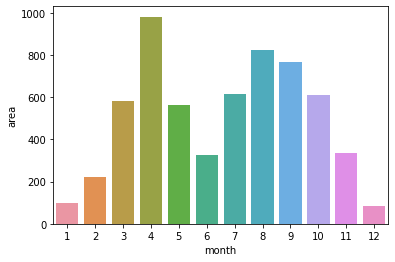

In [54]:
ds_train_full_termo = ds_train_full[ds_train_full['area'] == 1].copy(deep=True)
ds_train_full_termo['month'] = ds_train_full_termo.index.month.values
group_df_train_full = ds_train_full_termo.groupby('month').count()
sns.barplot(x=group_df_train_full.index, y=group_df_train_full.area)

In [55]:
len(ds_train_full)

38626

In [56]:
len(ds_train_full_termo)

6007

## Тренируем модель и проверяем на кросс-валидации

In [14]:
from sklearn.model_selection import train_test_split, cross_val_score, TimeSeriesSplit, KFold, cross_val_predict
from sklearn.preprocessing import MinMaxScaler, StandardScaler
#from imblearn.over_sampling import SMOTEN, ADASYN
from sklearn.metrics import accuracy_score, confusion_matrix
from xgboost import XGBClassifier

In [58]:
df_train_full = pd.read_parquet('df_train.gzip')

x = ds_train_full.drop(['area', 'thermo_area'], axis=1)
print(x.shape)
y = ds_train_full['area']
y_regression = ds_train_full['thermo_area']

y.value_counts()

(38626, 35)


0.0    32619
1.0     6007
Name: area, dtype: int64

In [59]:
%%time

# масштабируем признаки
scl = StandardScaler()
x_scl = pd.DataFrame(scl.fit_transform(x), columns=x.columns)

# старая Мишина модель
#model = XGBClassifier(random_state=42, n_estimators=100, use_label_encoder=False, max_depth=3)
#model = XGBClassifier(random_state=42, n_estimators=200, max_depth=3)

model = XGBClassifier(random_state=42, n_estimators=200, max_depth=4, eta=0.2, scale_pos_weight=2)

#model_xgb = XGBClassifier(random_state=42, n_estimators=200, max_depth=4, eta=0.2, scale_pos_weight=2)
#model_xgb = XGBClassifier(random_state=42, eta=0.2, max_depth=7, n_estimators=200, scale_pos_weight=2.0)

# paramas_grid = {'max_depth': range(1, 10, 1),
#                 'eta': np.arange(0.1, 1, 0.1),
#                 'scale_pos_weight': np.arange(1, 2.1, 0.5),
#                 'n_estimators': [50, 100, 150, 200]}

# grid = GridSearchCV(model_xgb, paramas_grid, scoring='f1', n_jobs=-1, cv=3)
# grid.fit(x_scl, y)
# model = grid.best_estimator_

#model = model_xgb

print(model)
# print(grid.best_params_)
# print(grid.best_score_.round(4))

model.fit(x_scl, y)

# точность на тренировке
train_predictions = model.predict(x_scl)
print('Точность на тренировке: {}'.format(accuracy_score(y, train_predictions)))

# сохраним константы
pickle.dump([list(x.columns), scl.mean_, scl.scale_], open('app/columns_and_scaling_const.pkl', 'wb'))
# сохраняем модель
pickle.dump(model, open('app/xgb_model.pkl', 'wb'))

XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, eta=0.2, gamma=None,
              gpu_id=None, importance_type='gain', interaction_constraints=None,
              learning_rate=None, max_delta_step=None, max_depth=4,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=200, n_jobs=None, num_parallel_tree=None,
              random_state=42, reg_alpha=None, reg_lambda=None,
              scale_pos_weight=2, subsample=None, tree_method=None,
              validate_parameters=None, verbosity=None)
[15:23:16] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Точность на тренировке: 0.994045461606172
CPU times: user 10 s, sys: 55.8 ms, total: 10.1 s
Wall time: 3.48 s


<AxesSubplot:>

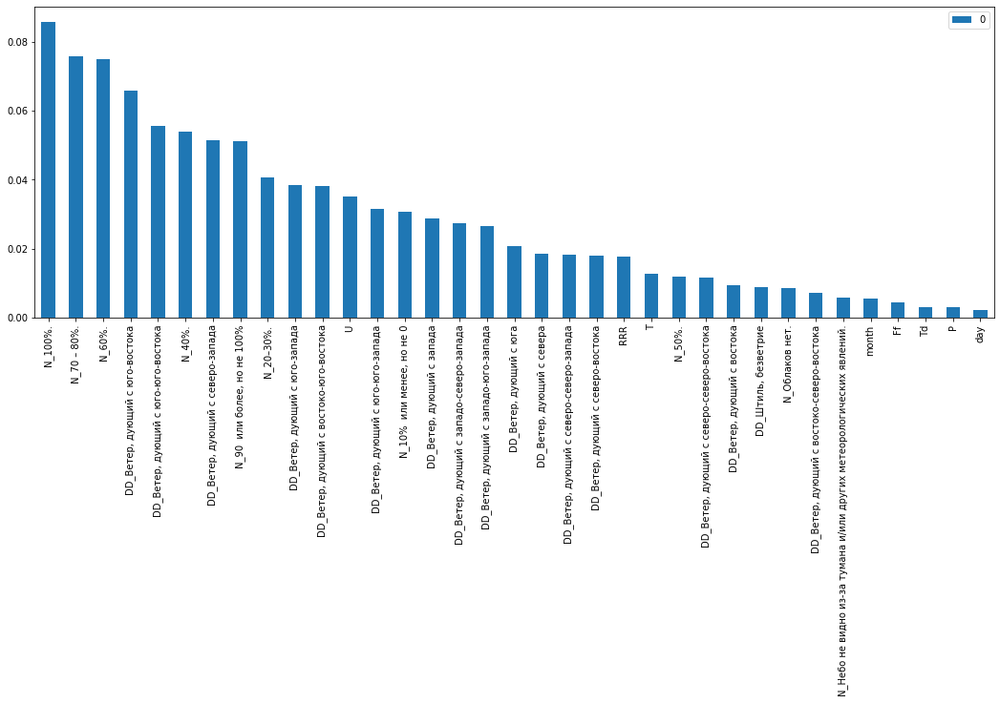

In [60]:
# важность признаков при построении модели
pd.DataFrame(data=model.feature_importances_, 
             index=x_scl.columns).sort_values(0, ascending=False).plot(kind='bar', figsize=(18,6))

In [61]:
# val_predictions = cross_val_predict(model, x_scl, y, cv=kf, n_jobs=-1)
# sns.heatmap(confusion_matrix(y, val_predictions), annot=True, fmt='.0f')
# plt.xlabel('Predicted')
# plt.ylabel('Actual');

In [62]:
#pickle.dump(model, open('app/xgb_model.pkl', 'wb')) # сохраняем модель

In [63]:
model_l = pickle.load(open('app/xgb_model.pkl', 'rb'))

# -----------------------------------------------------------------------------------

# Работа с данным для предсказаний термоточек в Самарской области

## Загрузка карты Самарской области

In [64]:
# samara = gpd.read_file('/content/drive/MyDrive/data/samara_region.shp') # загрузка карты самарской области
# # запись координат для визуализации границы
# for index, row in samara.iterrows():
# #     if samara['geometry'][index].type == 'Polygon':
# #         x, y = row.geometry.exterior.xy
# #         c_x, c_y = row.geometry.centroid.xy
#     poly = row.geometry
#     x, y = [], []
#     c_x, c_y = [], []
#     for p in poly:
#         x_, y_ = p.exterior.xy
#         x += x_.tolist()
#         y += y_.tolist()
#         c_x_, c_y_ = p.centroid.xy
#         c_x += c_x_.tolist()
#         c_y += c_y_.tolist()
# x,y = np.array(x), np.array(y)

## Загрузка термоточек Самарской область и препроцессинг

In [65]:
# загрузка термоточек
thermo_samara = pd.read_csv('data/thermo_sam_obl_test.csv', sep=',', index_col=0)

thermo_samara.head()

,lon,lat,area
acq_date,,,
2009-04-16,49.9925,53.4973,1
2009-07-28,49.9426,52.6976,1
2018-09-05,50.1540,52.8187,1
2011-10-21,49.1422,53.6759,1
2020-05-01,48.4441,52.9953,1


In [66]:
len(thermo_samara)

3372

In [67]:
thermo_samara.isna().sum()

lon     0
lat     0
area    0
dtype: int64

In [68]:
#thermo_samara.duplicated().sum()

In [69]:
#sns.histplot(thermo_samara['area'])

In [70]:
#thermo_samara['area'] = thermo_samara['area'].fillna(thermo_samara['area'].median()) # заполним пропуски
thermo_samara.to_csv('data/thermo_samara_edited.csv') # сохраняем очишенный датасет

## Загрузка погодных станций Самарской области

In [71]:
# Станции для измерения погоды в Самарской области
samara_station_names = ['Самара', 
                 'Авангард', 
                 'Сызрань', 
                 #'Серноводск', 
                 'Челно-Вершины', 
                 'Большая-Глущица',
                 #'Клявлино', 
                 #'Тольятти', 
                 #'Кинель-Черкассы', 
                 #'Дмитровград', 
                 'Бугуруслан']
samara_station_locs = [[50.13, 53.11], 
                [51.17, 52.37], 
                [48.28, 53.10], 
                #[51.16, 53.55], 
                [51.06, 54.25], 
                [50.28, 52.23],
                #[52.00, 54.18], 
                #[49.24, 53.32], 
                #[51.29, 53.29], 
                #[49.38, 54.14], 
                [52.26, 53.40]]
samara_stations = pd.DataFrame(samara_station_locs, index = samara_station_names, columns=['lon', 'lat'])
samara_stations.to_csv('data/samara_stations.csv')

In [72]:
samara_stations

,lon,lat
Самара,50.13,53.11
Авангард,51.17,52.37
Сызрань,48.28,53.10
Челно-Вершины,51.06,54.25
Большая-Глущица,50.28,52.23
Бугуруслан,52.26,53.40


## Визуализация термоточек Самарской области и погодных станций на карте

In [73]:
#48.28, 53.10

In [74]:
thermo_samara = pd.read_csv('data/thermo_samara_edited.csv', index_col=0) # загрузка термоточек
thermo_samara.index = pd.to_datetime(thermo_samara.index)
thermo_samara = thermo_samara[DATE_START:DATE_END]

In [75]:
thermo_samara

,lon,lat,area
acq_date,,,
2009-04-16,49.9925,53.4973,1
2009-07-28,49.9426,52.6976,1
2018-09-05,50.1540,52.8187,1
2011-10-21,49.1422,53.6759,1
2020-05-01,48.4441,52.9953,1
...,...,...,...
2009-04-28,48.8117,53.1990,1
2012-07-16,51.1889,52.8779,1
2015-09-21,49.2861,53.8174,1


In [76]:
# with urlopen(
# 'https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/russia.geojson') as response:
#      counties = json.load(response)
    
# SCALE = 10
# fig = go.Figure()

# fig.add_trace(go.Choroplethmapbox( # plot Russian map
#     geojson=counties,
#         ))

# #fig.add_trace( # plot Samara region borders
# #     go.Scattermapbox(
# #         lon=np.array(x), 
# #         lat=np.array(y), 
# #         mode='markers', 
# #         marker = dict(
# #             size=3, 
# #            #symbol='0',
# #             color='black',
# #         )))

# fig.add_trace(go.Scattermapbox( # plot thermopoints
#     lon = thermo_samara['lon'],#[:422],
#     lat = thermo_samara['lat'],#[:422],
#     mode = 'markers',
#     marker = dict(
#         size = 5, #thermo_samara['area']/SCALE,
#         color = 'red',
#         sizemode = 'area',
#         opacity=0.5), 
#     name = 'термоточки'
# ))

# # Добавим станции на карту
# for idx, station in samara_stations.iterrows():
#     fig.add_trace(go.Scattermapbox( # plot thermopoints
#         lon = [station.lon], lat = [station.lat], marker = dict(size=12, color='blue'), name = idx))

# fig.update_layout(
#     height=800,
#     width=1000,
#     mapbox_style="open-street-map",
#     mapbox_zoom=6.5, 
#     mapbox_center = {"lat": 53, "lon": 50},
#     margin={"r":0,"t":5,"l":0,"b":0})

# fig.show()

## Соотносим доступные термоточки с расположениями погодных станций

In [77]:
def calc_distance(a1, b1, a2, b2):
    "Расстояние между точками (не учитываем искривленность поверхности)"
    return np.sqrt((a1-a2)**2 + (b1-b2)**2)

min_dist_idx = []
min_dist = []
for _, th in thermo_samara.iterrows():
    dist = []
    for _,st in samara_stations.iterrows():
        dist.append(calc_distance(th['lon'], th['lat'], st['lon'], st['lat']))
    min_dist.append(min(dist))
    min_dist_idx.append(np.argmin(dist))

In [78]:
np.unique(min_dist_idx, return_counts=True)

(array([0, 1, 2, 3, 4, 5]), array([1040,  507,  530,  773,  202,  320]))

In [79]:
np.mean(min_dist), np.std(min_dist)

(0.5506053679271637, 0.2467002574231328)

In [80]:
thermo_samara_city = thermo_samara.iloc[np.where(np.array(min_dist_idx)==0)]
thermo_avangard = thermo_samara.iloc[np.where(np.array(min_dist_idx)==1)]
thermo_syzran = thermo_samara.iloc[np.where(np.array(min_dist_idx)==2)]
#thermo_sernovodsk = thermo_samara.iloc[np.where(np.array(min_dist_idx)==3)]
thermo_chelnoversh = thermo_samara.iloc[np.where(np.array(min_dist_idx)==3)]
thermo_glushica = thermo_samara.iloc[np.where(np.array(min_dist_idx)==4)]
#thermo_klyavlino = thermo_samara.iloc[np.where(np.array(min_dist_idx)==6)]
#thermo_tolyatti = thermo_samara.iloc[np.where(np.array(min_dist_idx)==7)]
thermo_buguruslan = thermo_samara.iloc[np.where(np.array(min_dist_idx)==5)]

thermo_samara = [thermo_samara_city, 
              thermo_avangard, 
              thermo_syzran, 
              #thermo_sernovodsk, 
              thermo_chelnoversh,
             thermo_glushica,
             #thermo_klyavlino,
             #thermo_tolyatti,
             thermo_buguruslan]

print([len(i) for i in thermo_samara])

[1040, 507, 530, 773, 202, 320]


In [81]:
#thermo_syzran

## Погода Самарской области (препроцессинг)

In [82]:
# Самара
pogoda_samara_city = pd.read_excel('pogoda/samara.xls', skiprows=6, index_col=0)
# Авангард
pogoda_avangard = pd.read_excel('pogoda/avangard.xls', skiprows=6, index_col=0)
# Сызрань
pogoda_syzran = pd.read_excel('pogoda/syzran.xls', skiprows=6, index_col=0)
# Серноводск
#pogoda_sernovodsk = pd.read_excel('pogoda/sernovodsk.xls', skiprows=6, index_col=0)
# Челно-Вершины
pogoda_chelnoversh = pd.read_excel('pogoda/chelnoversh.xls', skiprows=6, index_col=0)
# Большая-Глущица
pogoda_glushica = pd.read_excel('pogoda/glushica.xls', skiprows=6, index_col=0)
# Клявлино
#pogoda_klyavlino = pd.read_excel('pogoda/klyavlino.xls', skiprows=6, index_col=0)
# Тольятти
#pogoda_tolyatti = pd.read_excel('pogoda/tolyatti.xls', skiprows=6, index_col=0)
# Бугуруслан
pogoda_buguruslan = pd.read_excel('pogoda/buguruslan.xls', skiprows=6, index_col=0)

# собираем датасеты в список
pogoda_samara = [pogoda_samara_city, pogoda_avangard, pogoda_syzran, 
                 #pogoda_sernovodsk,
                 pogoda_chelnoversh, pogoda_glushica,
                 #pogoda_klyavlino, pogoda_tolyatti,
                 pogoda_buguruslan]

# делаем предобработку данных
pogoda_samara = list(map(prepare_weather_dataset, pogoda_samara))

Процент пропущенных значений  в Самаре:
Tg     0.960841
E'     0.949572
E      0.909764
Tx     0.875145
Tn     0.854958
tR     0.797692
U      0.002540
Td     0.002027
P      0.000946
DD     0.000649
Ff     0.000649
T      0.000540
N      0.000000
RRR    0.000000
dtype: float64
Процент пропущенных значений  в Авангарде Зерносовхозе:
E'     0.953698
Tg     0.952888
E      0.920583
Tn     0.898516
Tx     0.874917
tR     0.807357
DD     0.002603
Ff     0.002603
U      0.001677
T      0.000868
Td     0.000839
P      0.000405
N      0.000000
RRR    0.000000
dtype: float64
Процент пропущенных значений  в Сызрани:
Tg     0.957276
E'     0.950004
E      0.927145
Tx     0.875117
Tn     0.859209
tR     0.804374
U      0.002059
Td     0.001711
P      0.001444
T      0.000588
DD     0.000481
Ff     0.000374
N      0.000000
RRR    0.000000
dtype: float64
Процент пропущенных значений  в Челно-Вершинах:
Tg     0.958317
E'     0.945483
E      0.923852
Tx     0.875271
Tn     0.859282
tR     0.798508
U 

### Проверяем пропуски по погоде после ресемплирования в 1 день

In [83]:
pogoda_samara_city.resample('1D').mean()['T'].isnull().sum()

41

In [84]:
pogoda_avangard.resample('1D').mean()['T'].isnull().sum()

1

In [85]:
pogoda_syzran.resample('1D').mean()['T'].isnull().sum()

2

In [86]:
#pogoda_sernovodsk.resample('1D').mean()['T'].isnull().sum()

In [87]:
pogoda_chelnoversh.resample('1D').mean()['T'].isnull().sum()

2

In [88]:
pogoda_glushica.resample('1D').mean()['T'].isnull().sum()

2

In [89]:
#pogoda_klyavlino.resample('1D').mean()['T'].isnull().sum()

In [90]:
#pogoda_tolyatti.resample('1D').mean()['T'].isnull().sum()

In [91]:
pogoda_buguruslan.resample('1D').mean()['T'].isnull().sum()

2

In [92]:
print([p.isna().sum().sum() for p in pogoda_samara])
print([p.shape for p in pogoda_samara])

[0, 0, 0, 0, 0, 0]
[(34196, 8), (34518, 8), (34524, 8), (34522, 8), (34524, 8), (34520, 8)]


In [93]:
# def drop_crazy_values(ds):
#     """Функция для удаления заведомо неправильных значений температуры"""
#     idx_to_drop_s = []
#     idx_to_drop_w = []
#     for t,s in ds.iterrows():
#         if t.month in [5,6,7,8] and s['T']<0:
#             idx_to_drop_s.append(t)
#         elif t.month in [1,2,12] and s['T']>10:
#             idx_to_drop_w.append(t)
#     return ds.drop(idx_to_drop_s+idx_to_drop_w)

In [94]:
#pogoda_samara = list(map(drop_crazy_values, pogoda_samara))

In [95]:
# Температура по 4 станциям Самарской области
# plt.figure(figsize=(12,5))
# for p in pogoda_samara[:4]:
#     plt.plot(p['T'].resample('1d').mean(), label=p.index.name)
    
# plt.legend(loc=0)

In [96]:
# Разница в температурах между Самарой и городами в разных частях области
# plt.figure(figsize=(12,5))
# for p in pogoda_samara[1:4]:
#     plt.plot(pogoda_samara[0]['T'].resample('1d').mean() - p['T'].resample('1d').mean(), 
#              label=p.index.name)
#plt.legend(loc=0)

In [97]:
# for t in thermo_samara:
#     plt.figure(figsize=(14,4))
#     t['area'].resample('2w').count().plot(kind='bar') # временное распределение термоточек

In [98]:
pogoda_samara[0].columns

Index(['T', 'P', 'U', 'DD', 'Ff', 'N', 'Td', 'RRR'], dtype='object')

## Склеим датасеты (термо и погода) для предсказаний

In [99]:
thermo_samara[2]

,lon,lat,area
acq_date,,,
2011-10-21,49.1422,53.6759,1
2020-05-01,48.4441,52.9953,1
2014-08-17,49.0122,52.9994,1
2017-09-15,49.1702,53.6991,1
2012-07-30,48.5882,52.6347,1
...,...,...,...
2013-08-10,48.7613,52.7564,1
2014-04-10,49.1452,52.9610,1
2010-07-31,48.0335,53.4226,1


In [100]:
len(thermo_samara), len(pogoda_samara)

(6, 6)

In [101]:
thermo_samara[0].shape, pogoda_samara[0].shape

((1040, 3), (34196, 8))

In [102]:
ds_all_samara = []
for n in range(len(pogoda_samara)):
    ds = pd.merge(thermo_samara[n], pogoda_samara[n], left_index=True, right_index=True, how='outer') # термо + погода
    ds[ds.columns[:3]] = ds[ds.columns[:3]].fillna(0) # заполняем пропуски, связанные с термоточками
    ds[ds.columns[3:]] = ds[ds.columns[3:]].fillna(method='ffill') # заполняем пропуски, связанные с погодой
    ds_all_samara.append(ds) # добавялем к общему списку

In [103]:
print([p.shape for p in ds_all_samara]) # размерность датасетов по Самарской области
print([i.isna().sum().sum() for i in ds_all_samara]) # пропущенные значения по датасетам Самарской области

[(35236, 11), (35025, 11), (35054, 11), (35295, 11), (34726, 11), (34840, 11)]
[0, 0, 0, 0, 0, 0]


In [104]:
#ds_all_samara[7].loc['2020-03-31 22:00:00' : '2020-04-01 23:50:00']

In [105]:
ds_all_samara[2][ds_all_samara[2]['area'] > 0]['T'].describe()

count    530.000000
mean      13.266604
std        7.830752
min       -3.700000
25%        7.800000
50%       13.900000
75%       18.400000
max       30.900000
Name: T, dtype: float64

In [106]:
#df_train_full = pd.read_parquet('df_train.gzip')

In [107]:
for n in range(len(ds_all_samara)):
    ds_all_samara[n] = prepare_dataset(ds_all_samara[n]) # подготавливаем датасеты
    
    # добавим недостающие колонки, чтобы датасет был такого же размера как тренировочный
    df_temp = pd.DataFrame(columns=df_train_full.columns)
    for col in df_temp.columns:
        try:
            df_temp[col] = ds_all_samara[n][col]
        except:
            df_temp[col] = 0
    
    ds_all_samara[n] = df_temp
    
print([i.shape for i in ds_all_samara])

[(4325, 37), (4325, 37), (4325, 37), (4325, 37), (4325, 37), (4325, 37)]


In [108]:
ds_all_samara[2].index.unique()

DatetimeIndex(['2009-01-01', '2009-01-02', '2009-01-03', '2009-01-04',
               '2009-01-05', '2009-01-06', '2009-01-07', '2009-01-08',
               '2009-01-09', '2009-01-10',
               ...
               '2020-10-25', '2020-10-26', '2020-10-27', '2020-10-28',
               '2020-10-29', '2020-10-30', '2020-10-31', '2020-11-01',
               '2020-11-02', '2020-11-03'],
              dtype='datetime64[ns]', length=4325, freq='D')

In [109]:
ds_all_samara[0].columns

Index(['area', 'T', 'P', 'U', 'Ff', 'Td', 'RRR', 'DD_Ветер, дующий с востока',
       'DD_Ветер, дующий с востоко-северо-востока',
       'DD_Ветер, дующий с востоко-юго-востока', 'DD_Ветер, дующий с запада',
       'DD_Ветер, дующий с западо-северо-запада',
       'DD_Ветер, дующий с западо-юго-запада', 'DD_Ветер, дующий с севера',
       'DD_Ветер, дующий с северо-востока', 'DD_Ветер, дующий с северо-запада',
       'DD_Ветер, дующий с северо-северо-востока',
       'DD_Ветер, дующий с северо-северо-запада', 'DD_Ветер, дующий с юга',
       'DD_Ветер, дующий с юго-востока', 'DD_Ветер, дующий с юго-запада',
       'DD_Ветер, дующий с юго-юго-востока',
       'DD_Ветер, дующий с юго-юго-запада', 'DD_Штиль, безветрие',
       'N_10%  или менее, но не 0', 'N_100%.', 'N_20–30%.', 'N_40%.', 'N_60%.',
       'N_70 – 80%.', 'N_90  или более, но не 100%',
       'N_Небо не видно из-за тумана и/или других метеорологических явлений.',
       'N_Облаков нет.', 'day', 'month', 'thermo_area', 'N_5

In [110]:
# ds_all_samara[0].loc['2020-04-01 00:00:00' : '2020-04-01 23:50:00'].to_csv('data/samara_test.csv')
# ds_all_samara[1].loc['2020-04-01 00:00:00' : '2020-04-01 23:50:00'].to_csv('data/avangard_test.csv')
# ds_all_samara[3].loc['2020-04-01 00:00:00' : '2020-04-01 23:50:00'].to_csv('data/sernovodsk_test.csv')
# ds_all_samara[7].loc['2020-04-01 00:00:00' : '2020-04-01 23:50:00'].to_csv('data/tolyati_test.csv')




*******************************************************************************************************************************



# Исследовательский анализ термоточек

## Все термоточки с 2018 по 2020 год (230 тыс записей)

In [111]:
#thermo_all.head()

In [112]:
#thermo_all['month'] = thermo_all.index.month.values

In [113]:
# group_thermo_all = thermo_all.groupby('month').count()
# sns.barplot(x=group_thermo_all.index, y=group_thermo_all.area)

In [114]:
# sns.scatterplot(thermo_all.lat, thermo_all.lon)
# sns.scatterplot(train_stations.lat, train_stations.lon)

## Термоточки с обучающей выборки с 2018 по 2020 год (13 тыс записей)

In [115]:
#df_train_full = pd.read_parquet('df_train.gzip')

In [116]:

#df_train_full_termo.head()

In [117]:

#df_train_full_termo['month'].describe()

In [118]:
# df_train_full_termo = df_train_full[df_train_full['area'] == 1].copy(deep=True)
# df_train_full_termo['month'] = df_train_full_termo.index.month.values
# group_df_train_full = df_train_full_termo.groupby('month').count()
# sns.barplot(x=group_df_train_full.index, y=group_df_train_full.area)

## Все термоточки Самарская область с 2018 по 2020 год (419 записей)

In [119]:
# thermo_samara_period = thermo_samara[25:].sort_index()
# thermo_samara_period

In [120]:
# thermo_samara_period['month'] = thermo_samara_period.index.month.values
# thermo_samara_period.head()

In [121]:
# group_thermo_samara = thermo_samara_period.groupby('month').count()
# sns.barplot(x=group_thermo_samara.index, y=group_thermo_samara.area)

## Все термоточки Самара с погодой

In [122]:
# Самара
# ds_samara_thermo = ds_all_samara[0][ds_all_samara[0]['area'] == 1]
# ds_samara_thermo['T'].hist()

In [123]:
# group_ds_samara_thermo = ds_samara_thermo.groupby('month').count()
# sns.barplot(x=group_ds_samara_thermo.index, y=group_ds_samara_thermo.area)

## Все термоточки Сызрань с погодой

In [124]:
# Сызрань
# ds_syzran_thermo = ds_all_samara[2][ds_all_samara[2]['area'] == 1]
# ds_syzran_thermo['T'].hist()

In [125]:
# group_ds_syzran_thermo = ds_syzran_thermo.groupby('month').count()
# sns.barplot(x=group_ds_syzran_thermo.index, y=group_ds_syzran_thermo.area)

In [126]:
#df_train_full.loc['2018-02-09']

In [127]:
#print('Длина обучающей выборки', len(df_train_full))

In [128]:
# print('Описательные статистики по температуре (объекты с пожарами)')
# df_train_full[df_train_full['area'] == 1]['T'].describe()

In [129]:
# print('Частотная гистограмма температуры (объекты с пожарами)')
# df_train_full[df_train_full['area'] == 1]['T'].hist()

In [130]:
#ds_all_samara[2][ds_all_samara[2]['area'] > 0]['T'].describe()

In [131]:
# Сызрань
#ds_all_samara[2][ds_all_samara[2]['area'] > 0]['T'].hist()

In [132]:
# print('Термоточки Самара')
# display(thermo_samara_city.head(50))

In [133]:
# print('Термоточки Сызрань')
# display(thermo_syzran)

In [134]:
# l = [i for i in ds_all_samara[0].columns if 'DD' in i]
# for i in range(len(ds_all_samara)):
#     print(samara_station_names[i])
#     display(ds_all_samara[i].loc['2020-04-01 00:00:00' : '2020-04-01 23:50:00'])
#     print()

In [135]:
print([i['area'].value_counts() for i in ds_all_samara])

[0.0    3922
1.0     403
Name: area, dtype: int64, 0.0    4046
1.0     279
Name: area, dtype: int64, 0.0    4065
1.0     260
Name: area, dtype: int64, 0.0    4035
1.0     290
Name: area, dtype: int64, 0.0    4199
1.0     126
Name: area, dtype: int64, 0.0    4139
1.0     186
Name: area, dtype: int64]


In [136]:
#ds_all_samara[2][ds_all_samara[2].area == 1].head(50)

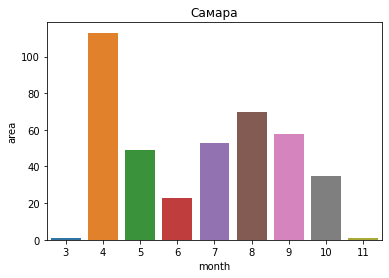

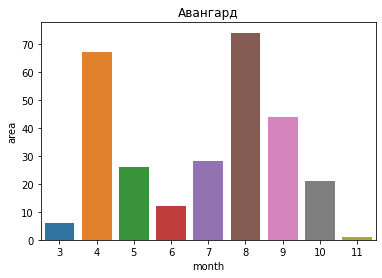

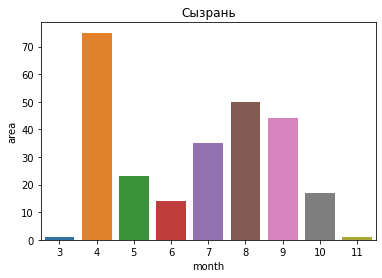

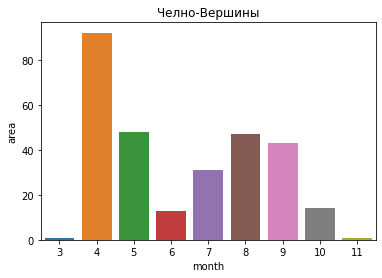

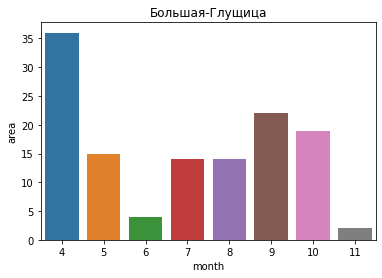

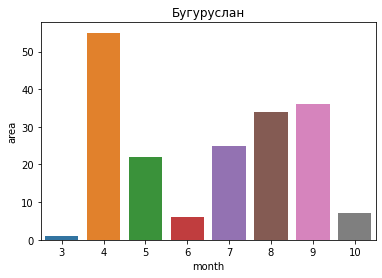

In [137]:
for ind in range(6):
    thermo_sam_obl_copy = ds_all_samara[ind][ds_all_samara[ind].area == 1].copy()
    thermo_sam_obl_copy['month'] = thermo_sam_obl_copy.index.month.values
    group_thermo_sam_obl_copy = thermo_sam_obl_copy.groupby('month').count()
    sns.barplot(x=group_thermo_sam_obl_copy.index, y=group_thermo_sam_obl_copy.area)
    plt.title(samara_station_names[ind])
    plt.show()

## Предсказание термоточек для Самарской области

Предсказания модели с порогом 0.5


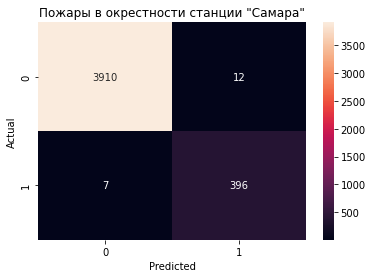

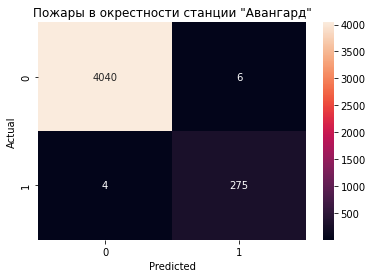

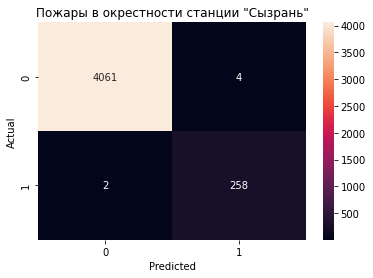

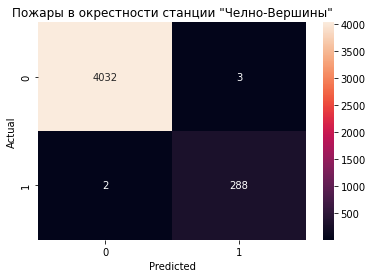

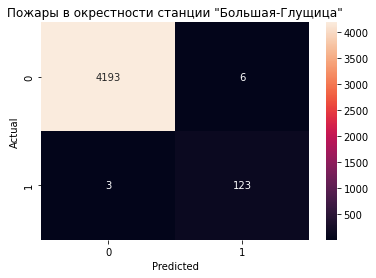

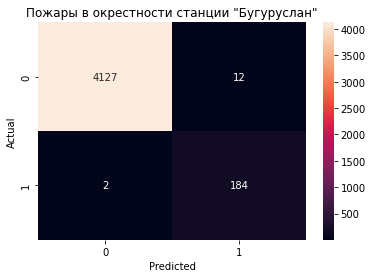

In [138]:
THRESH = 0.5
recall = []
f1 = []
auc_roc = []
accuracy = []
print('Предсказания модели с порогом {}'.format(THRESH))
    
for n, ds_s in enumerate(ds_all_samara):
    x_test = ds_s.drop(['area', 'thermo_area'], axis=1)
    y_test = ds_s['area']
    x_test_scl = pd.DataFrame(scl.transform(x_test), columns=x_test.columns)
    
    #prediction = list(map(lambda x: 0 if x>THRESH else 1, model.predict_proba(x_test_scl)[:,0]))
    
    # получаем вероятности отнесения к классам
    probabilities = model.predict_proba(x_test_scl)
    # получаем метки классов
    prediction = probabilities[:, 1] > THRESH
    
    #prediction = model.predict(x_test_scl)
    prediction = np.array(prediction)
    
    recall.append(recall_score(y_test, prediction))
    f1.append(f1_score(y_test, prediction))
    auc_roc.append(roc_auc_score(y_test, prediction))
    accuracy.append(accuracy_score(y_test, prediction))
    
    plt.figure()
    sns.heatmap(confusion_matrix(y_test, prediction), annot=True, fmt='.0f')
    plt.title('Пожары в окрестности станции \"{}\"'.format(samara_station_names[n]))
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

In [139]:
print('Значения Recall для станций: \n{}'.format(list(zip(samara_station_names, np.round(recall,3)))))

Значения Recall для станций: 
[('Самара', 0.983), ('Авангард', 0.986), ('Сызрань', 0.992), ('Челно-Вершины', 0.993), ('Большая-Глущица', 0.976), ('Бугуруслан', 0.989)]


In [140]:
print('Значения F1 для станций: \n{}'.format(list(zip(samara_station_names, np.round(f1,3)))))

Значения F1 для станций: 
[('Самара', 0.977), ('Авангард', 0.982), ('Сызрань', 0.989), ('Челно-Вершины', 0.991), ('Большая-Глущица', 0.965), ('Бугуруслан', 0.963)]


In [141]:
print('Значения AUC для станций: \n{}'.format(list(zip(samara_station_names, np.round(auc_roc,3)))))

Значения AUC для станций: 
[('Самара', 0.99), ('Авангард', 0.992), ('Сызрань', 0.996), ('Челно-Вершины', 0.996), ('Большая-Глущица', 0.987), ('Бугуруслан', 0.993)]


In [142]:
print('Значения accuracy для станций: \n{}'.format(list(zip(samara_station_names, np.round(accuracy,3)))))

Значения accuracy для станций: 
[('Самара', 0.996), ('Авангард', 0.998), ('Сызрань', 0.999), ('Челно-Вершины', 0.999), ('Большая-Глущица', 0.998), ('Бугуруслан', 0.997)]


In [143]:
#x_test.iloc[-2][:50]

In [144]:
raise StopIteration()

StopIteration: 

# Для создания приложения

In [ ]:
# p1 = ['2020-01-01', '-1.078', '759.4', '89', '4.78', '10.0', '-2.77', '0.2', 
#      'Ветер, дующий с западо-юго-запада', '100%.', '100%.', '200-300',
#     '-3.2', '6.6', '-4.4', '1.6']

In [ ]:
p = ['2020-04-01', '-1.078', '759.4', '89', '4.78', '10.0', '-2.77', '0.2', 
     'Ветер, дующий с западо-юго-запада', '100%.', '100%.', '200-300',
    '-3.2', '6.6', '-4.4', '1.6']

In [ ]:
ds = p

date_idx = ds[0]
for i in range(1, len(ds)):
    try:
        ds[i] = float(ds[i])
    except:
        pass

ds = pd.DataFrame([ds[1:]], 
                    columns = ['T', 'P', 'U', 'Ff', 'VV', 'Td', 'RRR', 
                    'DD', 'N', 'Nh', 'H',
                    'T_min', 'T_max','Td_min', 'Td_max'], 
                    index=[ds[0]])
ds.index = pd.to_datetime(ds.index)
a = pd.get_dummies(ds).copy()
a['day'] = a.index.day # день записи
a['month'] = a.index.month  # месяц записи

train_cols, scl_mean, scl_std = pickle.load(open('app/columns_and_scaling_const.pkl', 'rb'))
df_predict = pd.DataFrame(columns=train_cols)
for col in df_predict.columns:
    try:
        df_predict[col] = a[col]
    except:
        df_predict[col] = 0
        
df_predict
df_predict = (df_predict-scl_mean)/scl_std # масштабируем вектор

model = pickle.load(open('app/xgb_model.pkl', 'rb')) #load trained model
prediction_prob = np.round(model.predict_proba(df_predict)[0]*100, 2)[1] # предсказываем вероятность

In [ ]:
a.index

In [ ]:
prediction_prob

In [ ]:
f = np.array(['01-01-2020', '-1.078', '759.4', '', '', '', '', '', 'Штиль, безветрие', 'Облаков нет.', 'Облаков нет.', 'Менее 50', '', '', '', '', '', '', '', '', '', '', '', 'Штиль, безветрие', 'Облаков нет.', 'Облаков нет.', 'Менее 50', '', '', '', '1.6'])
d = f[1:].reshape(2,15)
d

In [1]:
data = {
        "Date" : "27-08-2021",
        "Самара":
            {
              "T": 23,
              "P": 752,
              "U": 39,
              "Ff": 2,
              "Td": 6,
              "RRR": 0,
              "DD": "Ветер, дующий с севера",
              "N": "Облаков нет."
            },
        "Авангард":
            {
              "T": 12,
              "P": 765,
              "U": 38,
              "Ff": 1,
              "Td": -1.9,
              "RRR": 0.0,
              "DD": "Ветер, дующий с юга",
              "N": "10%  или менее, но не 0"
            },
        "Сызрань":
            {
              "T": 12.4,
              "P": 754.1,
              "U": 78,
              "Ff": 3,
              "Td": 8.6,
              "RRR": 0,
              "DD": "Ветер, дующий с юго-запада",
              "N": "100%."
            },
        "Челно-Вершины":
            {
              "T": 4.5,
              "P": 759.3,
              "U": 55,
              "Ff": 3,
              "Td": 5.2,
              "RRR": 0.5,
              "DD": "Ветер, дующий с западо-юго-запада",
              "N": "60%."
            },
        "Большая-Глущица":
            {
              "T": 4.5,
              "P": 759.3,
              "U": 55,
              "Ff": 3,
              "Td": 5.2,
              "RRR": 0.5,
              "DD": "Ветер, дующий с западо-юго-запада",
              "N": "50%."
            },
        "Бугуруслан":
            {
              "T": 4.5,
              "P": 759.3,
              "U": 55,
              "Ff": 3,
              "Td": 5.2,
              "RRR": 0.5,
              "DD": "Ветер, дующий с западо-юго-запада",
              "N": "10%  или менее, но не 0"
            }
       }

In [ ]:
# старая функция неправильно выводит столбцы
# def preprocess_and_predict_loc(ds):

#     date_idx = ds[0]
#     for i in range(1, len(ds)):
#         try:
#             ds[i] = float(ds[i])
#         except:
#             pass

#     ds = pd.DataFrame([ds[1:]], 
#                         columns = ['T', 'P', 'U', 'Ff', 'VV', 'Td', 'RRR', 
#                         'DD', 'N', 'Nh', 'H',
#                         'T_min', 'T_max','Td_min', 'Td_max'], 
#                         index=[ds[0]])
#     ds.index = pd.to_datetime(ds.index)
#     a = pd.get_dummies(ds).copy()
#     a['day'] = a.index.day # день записи
#     a['month'] = a.index.month  # месяц записи

#     train_cols, scl_mean, scl_std = pickle.load(open('app/columns_and_scaling_const.pkl', 'rb'))
#     cols_to_add = list(set(train_cols) - set(a.columns))
#     a[cols_to_add] = 0 # вектор подготовлен
#     a = (a-scl_mean)/scl_std # масштабируем вектор

#     display(a.columns)
    
#     model = pickle.load(open('app/xgb_model.pkl', 'rb')) #load trained model
#     prediction_prob = np.round(model.predict_proba(a)[0]*100, 2)[1] # предсказываем вероятность
    
#     return date_idx, prediction_prob

In [ ]:
# Мишина старая функция
def preprocess_and_predict_app(ds):
    date_idx = ds[0]
    for i in range(1, len(ds)):
        try:
            ds[i] = float(ds[i])
        except:
            pass
    ds = pd.DataFrame([ds[1:]], 
                        columns = ['T', 'P', 'U', 'Ff', 'VV', 'Td', 'RRR', 
                        'DD', 'N', 'Nh', 'H',
                        'T_min', 'T_max','Td_min', 'Td_max'], 
                        index=[ds[0]])
    
    display(ds.info())
    ds.index = pd.to_datetime(ds.index, dayfirst=True)
    a = pd.get_dummies(ds).copy()
    a['day'] = a.index.day # день записи
    a['month'] = a.index.month  # месяц записи

    train_cols, scl_mean, scl_std = pickle.load(open('app/columns_and_scaling_const.pkl', 'rb'))
    model = pickle.load(open('app/xgb_model.pkl', 'rb')) #load trained model

    df_predict = pd.DataFrame(columns=train_cols)
    for col in df_predict.columns:
        try:
            df_predict[col] = a[col]
        except:
            df_predict[col] = 0

    df_predict = (df_predict-scl_mean)/scl_std # масштабируем вектор
    prediction_prob = np.round(model.predict_proba(df_predict)[0]*100, 2)[1] # предсказываем вероятность
    
    
    return date_idx, prediction_prob

In [ ]:
# удалить потом
def preprocess_and_predict_prev(value_list):
    
    """
    получает данные с gui и предсказывает
    
    памаметры: список значений полей с gui
    """
    
    # количество станций на странице в gui
    STATIONS_AMOUNT = 1
    # количество полей для каждой станции на странице в gui
    FIELDS_AMOUNT = 9
    
    # считываем станции
    samara_stations = pd.read_csv('data/samara_stations.csv', index_col=0)[:STATIONS_AMOUNT]
    
   
    # присваиваем значение даты
    date_idx = value_list[0]
    
    # переводим список в массив
    value_array = np.array(value_list[1:])
    
    # приводим массив к нужному размеру
    value_array = value_array.reshape(STATIONS_AMOUNT,FIELDS_AMOUNT)
    
    # формируем dataframe для предсказания
    ds = pd.DataFrame(data=value_array, 
                      columns = ['T', 'P', 'U', 'Ff', 'Td', 'RRR',
                                 'DD', 'N'], 
                      index=[date_idx for i in range(STATIONS_AMOUNT)])
    
    # индекс переводим к типу дата
    ds.index = pd.to_datetime(ds.index, dayfirst=True) 

    # приводим к типу float те столбцы, где возможно
    for col in ds.columns:
        try:
            ds[col] = ds[col].astype('float')
        except:
            pass    
    
    # кодирование OHE
    a = pd.get_dummies(ds).copy()
    
    # добавление новых столбцов дня и месяца
    a['day'] = a.index.day # день записи
    a['month'] = a.index.month  # месяц записи

    # получаем список тренировочных столбцов, mean и std для стандартизации
    train_cols, scl_mean, scl_std = pickle.load(open('app/columns_and_scaling_const.pkl', 'rb'))
    # загружаем модель
    model = pickle.load(open('app/xgb_model.pkl', 'rb'))

    # формируем DF со всеми тренировочными столбцами
    # и значениями из gui
    df_predict = pd.DataFrame(columns=train_cols)
    for col in df_predict.columns:
        try:
            df_predict[col] = a[col]
        except:
            df_predict[col] = 0

    # стандартизация
    df_predict = (df_predict-scl_mean)/scl_std # масштабируем вектор
    
    # получаем массив вероятностей возникновеня пожара для всех станций
    prediction_prob = model.predict_proba(df_predict.values).T[1]
    
    # название колонки с вероятностью возникновения пожара
    column_P = 'P'
    # название колонки с координатами станции
    column_lon_lat = '(долгота, широта)'
    
    # получаем (долготу, широту)
    lon_lat = [*zip(samara_stations['lon'].values, samara_stations['lat'].values)]

    # DF с предсказаниями
    prediction_prob_ds = pd.DataFrame(data=prediction_prob, index=samara_stations.index, columns=[column_P])
    
    # приводим P к формату %
    #prediction_prob_ds[column_P] = [*map('{:.2%}'.format, prediction_prob_ds[column_P])]
    
    # добавляем столбец с координатами
    prediction_prob_ds[column_lon_lat] = lon_lat
    
    #data_json = prediction_prob_ds.to_json(orient='records')[1:-1].replace('},{', '} {')
    #display(data_json)
    #data_json = prediction_prob_ds.to_json()
    
    # декод
    #data_json = prediction_prob_ds.to_json(orient='records')[1:-1].replace('},{', '} {')
    
    # получаем вероятность в %
    p = [*map('{:.2%}'.format, prediction_prob_ds[column_P])]

    # словарь для передачи на gui
    data_dict = {'station': samara_stations.index.to_list(),
                 'lon_lat': lon_lat,
                 'P': [*map('{:.2%}'.format, prediction_prob_ds[column_P])]}

    # переводим словарь в json
    # encode() - переводим в байтовую строку, декодируем
    data_json = json.dumps(data_dict).encode().decode('unicode-escape')
    
    # возвращаем дату и DF с предсказаниями
    return json.dumps(date_idx), data_json

In [147]:
def preprocess_and_predict(value_dict):
    
    """
    предсказывает вероятность возникновения пожара по переданным показателям
    погоды в словаре с разбивкой по погодным станциям
    
    параметры: словарь значений,
    value_dict['Date'] - дата получения данных по погоде в формате день-месяц-год
    остальные ключи в словаре - погодные станции, названия которых должны совпадать
    с названиями станций, их количеством и порядком их следования из файла samara_stations
    """
    
    # количество станций в словаре
    # берем длину словаря и отнимаем 1 (элемент с датой)
    stations_amount = len(value_dict) - 1
    
    # считываем станции
    samara_stations = pd.read_csv('data/samara_stations.csv', index_col=0)[:stations_amount]
    
    # получаем список значений показателей для станций
    value_list = [list(value_dict[station].values()) for station in samara_stations.index]

    # присваиваем значение даты
    date_idx = value_dict['Date']
    
    # переводим список показателей в массив
    value_array = np.array(value_list)
    
    # формируем dataframe для предсказания
    ds = pd.DataFrame(data=value_array, 
                      columns = ['T', 'P', 'U', 'Ff', 'Td', 'RRR',
                                 'DD', 'N'], 
                      index=[date_idx for i in range(stations_amount)])
    
    # индекс переводим к типу дата
    ds.index = pd.to_datetime(ds.index, dayfirst=True) 

    # приводим к типу float те столбцы, где возможно
    for col in ds.columns:
        try:
            ds[col] = ds[col].astype('float')
        except:
            pass    
    
    # кодирование OHE
    a = pd.get_dummies(ds).copy()
    
    # добавление новых столбцов дня и месяца
    a['day'] = a.index.day # день записи
    a['month'] = a.index.month  # месяц записи

    # получаем список тренировочных столбцов, mean и std для стандартизации
    train_cols, scl_mean, scl_std = pickle.load(open('app/columns_and_scaling_const.pkl', 'rb'))
    # загружаем модель
    model = pickle.load(open('app/xgb_model.pkl', 'rb'))

    # формируем DF со всеми тренировочными столбцами
    # и значениями из gui
    df_predict = pd.DataFrame(columns=train_cols)
    for col in df_predict.columns:
        try:
            df_predict[col] = a[col]
        except:
            df_predict[col] = 0

    
    display(df_predict)
    # стандартизация
    df_predict = (df_predict-scl_mean)/scl_std # масштабируем вектор
    
    # получаем массив вероятностей возникновеня пожара для всех станций
    prediction_prob = model.predict_proba(df_predict.values).T[1]
    
    # получаем (долготу, широту)
    lon_lat = [*zip(samara_stations['lon'].values, samara_stations['lat'].values)]

    # получаем вероятность в %
    p = [*map('{:.2%}'.format, prediction_prob)]

    # словарь для передачи
    data_dict = {'station': samara_stations.index.to_list(),
                 'lon_lat': lon_lat,
                 'P': p}

    # переводим словарь в json
    # encode() - переводим в байтовую строку, декодируем
    data_json = json.dumps(data_dict).encode().decode('unicode-escape')
    
    # возвращаем дату и json с предсказаниями
    return data_json

In [ ]:
p = ['01-04-2020', '-1.078', '759.4', '89', '4.78', '10.0', '-2.77', '0.2', 
     'Ветер, дующий с западо-юго-запада', '100%.', '100%.', '200-300',
    '-3.2', '6.6', '-4.4', '1.6', \
     
     '3.2', '754.1', '59.25', '1.625', '-4.2', '0', 
     'Ветер, дующий с севера', '90  или более, но не 100%', \
     
     '4.5', '759.3', '55', '3', '0', '5.2', '0.5', 
     'Ветер, дующий с западо-юго-запада', '70 – 80%.', '0', '0',
    '0', '0', '0', '0']

In [ ]:
date, pred = preprocess_and_predict_prev(p)
print('Вероятность возникновения пожара на дату {} при заданных погодных условиях:'.format(date))
display(pred)

# Предикт для приложения

In [162]:
pred = preprocess_and_predict(data)
#print('Вероятность возникновения пожара на дату {} при заданных погодных условиях:'.format(date))
display(pred)

,T,P,U,Ff,Td,RRR,"DD_Ветер, дующий с востока","DD_Ветер, дующий с востоко-северо-востока","DD_Ветер, дующий с востоко-юго-востока","DD_Ветер, дующий с запада",...,N_20–30%.,N_40%.,N_60%.,N_70 – 80%.,"N_90 или более, но не 100%",N_Небо не видно из-за тумана и/или других метеорологических явлений.,N_Облаков нет.,day,month,N_50%.
2021-08-27,23.0,752.0,39.0,2.0,6.0,0.0,0,0,0,0,...,0,0,0,0,0,0,1,27,8,0
2021-08-27,12.0,765.0,38.0,1.0,-1.9,0.0,0,0,0,0,...,0,0,0,0,0,0,0,27,8,0
2021-08-27,12.4,754.1,78.0,3.0,8.6,0.0,0,0,0,0,...,0,0,0,0,0,0,0,27,8,0
2021-08-27,4.5,759.3,55.0,3.0,5.2,0.5,0,0,0,0,...,0,0,1,0,0,0,0,27,8,0
2021-08-27,4.5,759.3,55.0,3.0,5.2,0.5,0,0,0,0,...,0,0,0,0,0,0,0,27,8,1
2021-08-27,4.5,759.3,55.0,3.0,5.2,0.5,0,0,0,0,...,0,0,0,0,0,0,0,27,8,0


'{"station": ["Самара", "Авангард", "Сызрань", "Челно-Вершины", "Большая-Глущица", "Бугуруслан"], "lon_lat": [[50.13, 53.11], [51.17, 52.37], [48.28, 53.1], [51.06, 54.25], [50.28, 52.23], [52.26, 53.4]], "P": ["82.65%", "47.97%", "8.96%", "66.20%", "61.45%", "52.19%"]}'

In [ ]:
# p = ['01-04-2020', '-1.75', '759.3', '93.6', '3.63', '10.0', '-2.66', '0.2', 
#      'Ветер, дующий с юго-запада', '20–30%.', '20–30%.', '200-300',
#     '-3.2', '6.6', '-4.4', '1.6']
p = ['01-04-2020', '4.5', '759.3', '55', '3', '0', '5.2', '0.5', 
     'Ветер, дующий с западо-юго-запада', '70 – 80%.', '0', '0',
    '0', '0', '0', '0']

In [ ]:
p = ['01-04-2020', '3.2', '754.1', '59.25', '1.625', '-4.2', '0', 
     'Ветер, дующий с севера', '90  или более, но не 100%']

In [ ]:
date, pred = preprocess_and_predict_app(p)
print("Вероятность возникновения пожара {} при заданных погодных условиях составляет {}%".format(date, pred))

# Клиентская сторона для ввода данных и запроса на сервер

In [2]:
import requests

In [157]:
# r = requests.post('http://127.0.0.1:5000/service_weather', json = data)

# if r.ok:
#     print(r.json())

In [4]:
requests.get('http://172.21.186.159:5000/')

<Response [200]>

In [ ]:
data = {
        "Date" : "27-08-2021",
        "Самара":
            {
              "T": 23,
              "P": 752,
              "U": 39,
              "Ff": 2,
              "Td": 6,
              "RRR": 0,
              "DD": "Ветер, дующий с севера",
              "N": "Облаков нет."
            },
        "Авангард":
            {
              "T": 12,
              "P": 765,
              "U": 38,
              "Ff": 1,
              "Td": -1.9,
              "RRR": 0.0,
              "DD": "Ветер, дующий с юга",
              "N": "10%  или менее, но не 0"
            },
        "Сызрань":
            {
              "T": 12.4,
              "P": 754.1,
              "U": 78,
              "Ff": 3,
              "Td": 8.6,
              "RRR": 0,
              "DD": "Ветер, дующий с юго-запада",
              "N": "100%."
            },
        "Челно-Вершины":
            {
              "T": 4.5,
              "P": 759.3,
              "U": 55,
              "Ff": 3,
              "Td": 5.2,
              "RRR": 0.5,
              "DD": "Ветер, дующий с западо-юго-запада",
              "N": "60%."
            },
        "Большая-Глущица":
            {
              "T": 4.5,
              "P": 759.3,
              "U": 55,
              "Ff": 3,
              "Td": 5.2,
              "RRR": 0.5,
              "DD": "Ветер, дующий с западо-юго-запада",
              "N": "50%."
            },
        "Бугуруслан":
            {
              "T": 4.5,
              "P": 759.3,
              "U": 55,
              "Ff": 3,
              "Td": 5.2,
              "RRR": 0.5,
              "DD": "Ветер, дующий с западо-юго-запада",
              "N": "10%  или менее, но не 0"
            }
       }


'''
1. Send data
2. ticket
3.status
4.ready
5.


http не для REST (Время должно быть прогнозируемо)
через rest - обработай вот это


flask убивает процессы
1. опрделить входы выход DS алгоритма (четкие входы и выходы)
2. модули 
3. система контрактов между DS и ПО (сопоставить поля входа и выход, как части системы знают, что работы выполнена)
(messages) rabbitmq
4. брокер раздачи процессов


Конструктор:
промежуточные данные хранить в могно с id блок
коллекция для workspace

если данные изменились в блоке - регенерация

избавиться от файлов, от С++

изолировать workscpace и данные блока
'''

In [7]:
r = requests.post('http://172.21.186.159:5000/service_fires', json = описание функции)

#if r.ok:
#    print(r.json())

r.json()

{'station': ['Самара',
  'Авангард',
  'Сызрань',
  'Челно-Вершины',
  'Большая-Глущица',
  'Бугуруслан'],
 'lon_lat': [[50.13, 53.11],
  [51.17, 52.37],
  [48.28, 53.1],
  [51.06, 54.25],
  [50.28, 52.23],
  [52.26, 53.4]],
 'P': ['82.65%', '47.97%', '8.96%', '66.20%', '61.45%', '52.19%']}

In [ ]:
r = requests.post('https://service-forecast-fire.herokuapp.com/service_fires', json = data)
if r.ok:
    print(r.json())

## Тренировка нейронной сети

In [ ]:

# Входной полносвязный слой, 800 нейронов, 784 входа в каждый нейрон
input_ = keras.layers.Input(shape = x_train_scl.shape)
x = keras.layers.Dense(512, activation="relu")(input_)
x = keras.layers.Dropout(0.22)(x)
x = keras.layers.BatchNormalization(x)
x = keras.layers.Dense(256, activation = 'relu')(x)
x = keras.layers.Dropout(0.18)(x)
x = keras.layers.BatchNormalization(x)
x = keras.layers.Dense(64, activation= 'relu')(x)
x = keras.layers.Dropout(0.25)(x)
x = keras.layers.BatchNormalization(x)
x = keras.layers.Dense(32, activation= 'relu')(x)
x = keras.layers.Dropout(0.2)(x)
output_ = keras.layers.Dense(y_train.shape[1], activation="sigmoid")(x)

model = keras.Model(input_, output_, name='dense model')

model.compile(loss=keras.losses.MeanSquaredError(), 
              optimizer=keras.optimizers.Adam(), 
              metrics=keras.metrics.Accuracy())
print(model.summary())

history = model.fit(x_train_scl, 
                    y_train, 
                    batch_size=100, 
                    epochs= 50,
                    validation_data=(x_test_scl, y_test),
                    verbose=1)

plt.plot(history.history['loss'], 
         label='Средняя абсолютная ошибка на обучающем наборе')
plt.plot(history.history['val_loss'], 
         label='Ошибка на проверочном наборе')
plt.ylabel('Средняя ошибка')
plt.legend()
plt.show()

In [ ]:
# Лучшая полносвязная модель
model = keras.models.Sequential()
# Входной полносвязный слой 
model.add(keras.layers.Dense(256, input_dim = x_train.shape[1], activation="relu"))
model.add(keras.layers.Dropout(0.22))
model.add(keras.layers.BatchNormalization())
# 1 скрытый слой
model.add(keras.layers.Dense(128, activation = 'relu'))
model.add(keras.layers.Dropout(0.18))
model.add(keras.layers.BatchNormalization())
# 2 скрытый слой
model.add(keras.layers.Dense(64, activation= 'relu'))
model.add(keras.layers.Dropout(0.25))
model.add(keras.layers.BatchNormalization())
# 3 скрытый слой
model.add(keras.layers.Dense(32, activation= 'relu'))
model.add(keras.layers.Dropout(0.2))
# Выходной полносвязный слой, (по количеству классов: 1 и 0)
model.add(keras.layers.Dense(1, activation="sigmoid"))

# Компиляция модели
model.compile(loss="mse", optimizer="adam", metrics=['accuracy'])

print(model.summary())
history = model.fit(x_train_scl,
                    y_train, 
                    batch_size=400, 
                    epochs= 80,
                    validation_data=(x_test_scl, y_test),
                    verbose=1)
plt.figure(figsize=(15,10))
plt.plot(history.history['loss'], 
         label='Средняя абсолютная ошибка на обучающем наборе')
plt.plot(history.history['val_loss'], 
         label='Ошибка на проверочном наборе')
plt.plot(history.history['val_accuracy'], 
         label='Точность на проверочной выборке')
plt.ylabel('Средняя ошибка')
plt.legend()
plt.show()

In [ ]:
confusion_matrix(y_test.values, model.predict_classes(x_test_scl))

In [ ]:
y_test.values

In [ ]:
model.predict_classes(x_test_scl)

In [ ]:
g = {
  "DD": "\u0428\u0442\u0438\u043b\u044c, \u0431\u0435\u0437\u0432\u0435\u0442\u0440\u0438\u0435", 
  "Ff": "4.78", 
  "H": "\u041c\u0435\u043d\u0435\u0435 50", 
  "N": "\u041e\u0431\u043b\u0430\u043a\u043e\u0432 \u043d\u0435\u0442.", 
  "Nh": "\u041e\u0431\u043b\u0430\u043a\u043e\u0432 \u043d\u0435\u0442.", 
  "P": "759.4", 
  "RRR": "0.2", 
  "T": "-1.078", 
  "T_max": "-3.2", 
  "T_min": "6.6", 
  "Td": "-2.77", 
  "Td_max": "-4.4", 
  "Td_min": "1.6", 
  "U": "89", 
  "VV": "10.0", 
  "date": "2020-01-01"
}

In [ ]:
p = list(g.values())
p